<a href="https://colab.research.google.com/github/tomorn112/ZC-DINO-ER/blob/part1/heneggGSAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Zero-Shot Eggshell Crack Detection Using Grounding DINO and FFT-Based Outer-to-Inner Ring Energy Ratio**
### This repository contains the supplementary code for the journal submitted to IEEE Access (2025) titled: "Zero-Shot Eggshell Crack Detection Using Grounding DINO and FFT-Based Outer-to-Inner Ring Energy Ratio".
# **Part: 1 Cropped and Removed Background using GroundedSAM**
###This section provides the implementation for preprocessing eggshell images by cropping and removing backgrounds using GroundedSAM. The processed images serve as input for the subsequent zero-shot crack detection pipeline.
##Features:
###GroundedSAM-based segmentation: Automatically detects and removes image backgrounds.
###Preprocessing pipeline: Prepares images for further analysis using FFT-based feature extraction.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
!python --version

Python 3.11.11


In [ ]:
!pip install -q \
autodistill \
autodistill-grounded-sam \
autodistill-yolov8 \
supervision==0.9.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 527.0/527.0 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install git+https://github.com/autodistill/autodistill-grounded-sam-2 rf_groundingdino -q

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 36.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 107.7 MB/s eta 0:00:00


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!mkdir {HOME}/images

In [ ]:
import supervision as sv

image_paths = sv.list_files_with_extensions(
    directory='/content/drive/MyDrive/Thesis/Egg/test_egg',
    extensions=["png", "jpg", "jpeg"])

print('image count:', len(image_paths))

image count: 12


In [ ]:
IMAGE_DIR_PATH = f"/content/drive/MyDrive/Thesis/Egg/test_egg"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128196 (\N{PAGE FACING UP}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128207 (\N{STRAIGHT RULER}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128194 (\N{OPEN FILE FOLDER}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


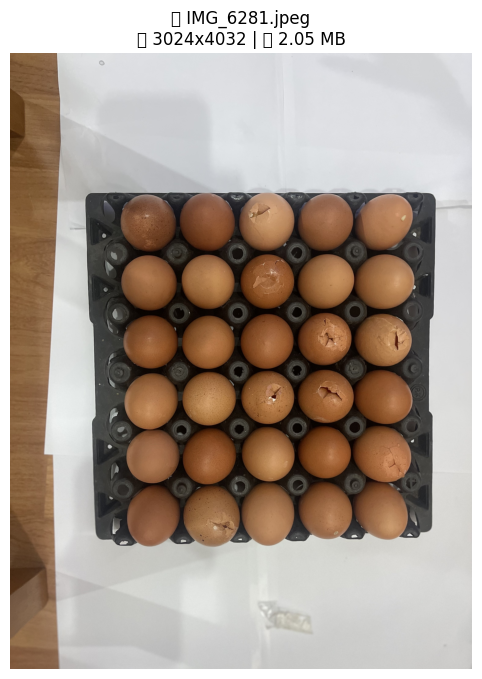


✅ Original Image Details:
📄 File Name: IMG_6281.jpeg
📏 Resolution: 3024 x 4032 pixels
📂 File Size: 2.05 MB


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# ✅ Define the original image path
ORIGINAL_IMAGE_PATH = "/content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6281.jpeg"

# ✅ Check if the file exists before proceeding
if os.path.exists(ORIGINAL_IMAGE_PATH):
    # ✅ Load the image
    image = cv2.imread(ORIGINAL_IMAGE_PATH)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for proper display

    # ✅ Get image dimensions (width × height)
    image_height, image_width = image.shape[:2]

    # ✅ Get file size in MB
    image_size_mb = os.path.getsize(ORIGINAL_IMAGE_PATH) / (1024 * 1024)

    # ✅ Extract file name from path
    image_filename = os.path.basename(ORIGINAL_IMAGE_PATH)

    # ✅ Display image with title
    plt.figure(figsize=(8, 8))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"📄 {image_filename}\n📏 {image_width}x{image_height} | 📂 {image_size_mb:.2f} MB")
    plt.show()

    # ✅ Print details in console
    print(f"\n✅ Original Image Details:")
    print(f"📄 File Name: {image_filename}")
    print(f"📏 Resolution: {image_width} x {image_height} pixels")
    print(f"📂 File Size: {image_size_mb:.2f} MB")
else:
    print(f"⚠️ Error: Image file '{ORIGINAL_IMAGE_PATH}' not found!")


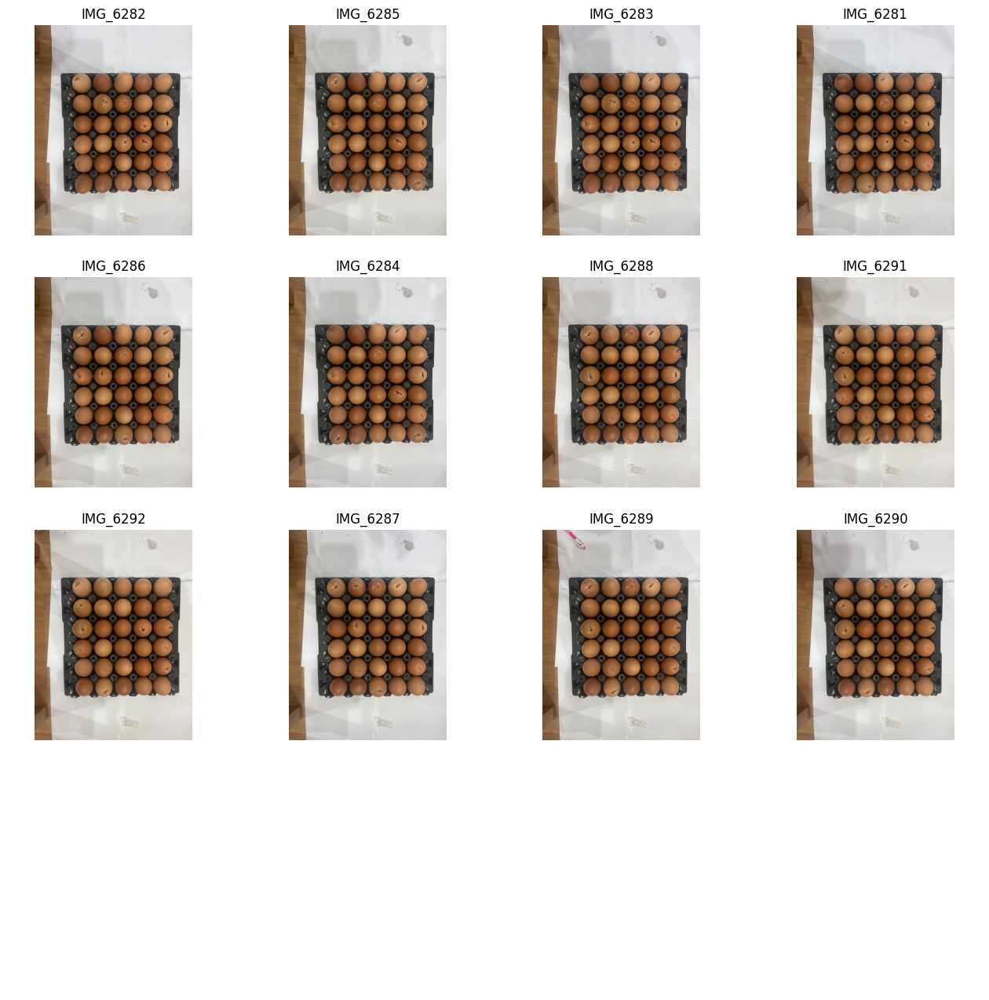

In [ ]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

In [ ]:
!pip install roboflow

In [ ]:
!pip show roboflow

Name: roboflow
Version: 1.1.58
Summary: Official Python package for working with the Roboflow API
Home-page: https://github.com/roboflow-ai/roboflow-python
Author: Roboflow
Author-email: support@roboflow.com
License: UNKNOWN
Location: /usr/local/lib/python3.11/dist-packages
Requires: certifi, cycler, filetype, idna, kiwisolver, matplotlib, numpy, opencv-python-headless, Pillow, pillow-heif, python-dateutil, python-dotenv, PyYAML, requests, requests-toolbelt, six, tqdm, urllib3
Required-by: autodistill-florence-2, autodistill_grounded_sam_2


In [ ]:
from autodistill.detection import CaptionOntology

ontology=CaptionOntology({"egg": "egg"})

In [ ]:
DATASET_DIR_PATH = f"{HOME}/dataset5"

# Testing for Memory Use, GPU-CPU Performance, and Parameter Count with Latency Analysis

In [ ]:
import os
import time
import cv2
import torch
import psutil  # To monitor CPU and memory usage
import supervision as sv
from autodistill_grounded_sam import GroundedSAM
from autodistill.detection import CaptionOntology
from pathlib import Path

# ✅ Define input and output directories
IMAGE_DIR_PATH = "/content/drive/MyDrive/Thesis/Egg/test_egg"
DATASET_DIR_PATH = "./dataset5"
IMAGES_OUTPUT_DIR = os.path.join(DATASET_DIR_PATH, "train/images")
LABELS_OUTPUT_DIR = os.path.join(DATASET_DIR_PATH, "train/labels")
DATA_YAML_PATH = os.path.join(DATASET_DIR_PATH, "data.yaml")

# ✅ Ensure directories exist
Path(DATASET_DIR_PATH).mkdir(parents=True, exist_ok=True)
Path(IMAGES_OUTPUT_DIR).mkdir(parents=True, exist_ok=True)
Path(LABELS_OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

# ✅ Load the model with ontology
ontology = CaptionOntology({"egg": "object"})

device = 'cuda' if torch.cuda.is_available() else 'cpu'
base_model = GroundedSAM(ontology=ontology)

# ✅ Move the model to GPU if available
if hasattr(base_model.grounding_dino_model, 'model') and isinstance(base_model.grounding_dino_model.model, torch.nn.Module):
    base_model.grounding_dino_model.model.to(device)

# ✅ Function to count model parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# ✅ Get model parameter count
parameter_count = 0
if hasattr(base_model.grounding_dino_model, 'model') and isinstance(base_model.grounding_dino_model.model, torch.nn.Module):
    parameter_count = count_parameters(base_model.grounding_dino_model.model)
    print(f"🔍 GroundedSAM Model Parameter Count: {parameter_count}")

# ✅ Initialize performance metrics
inference_latencies = []
total_process_times = []
fps_values = []
gpu_memory_usages = []
cpu_usages = []
ram_usages = []

# ✅ Start processing images
image_files = sorted(os.listdir(IMAGE_DIR_PATH))
total_images = len(image_files)
overall_start_time = time.time()  # Track total time for all images

for i, IMAGE_PATH in enumerate(image_files):
    image_full_path = os.path.join(IMAGE_DIR_PATH, IMAGE_PATH)
    print(f"📸 Processing: {image_full_path}")

    # ✅ Free up GPU memory before inference
    if device == 'cuda':
        torch.cuda.empty_cache()

    # ✅ Measure full processing time (loading + inference + annotation + saving)
    process_start_time = time.time()

    # ✅ Load image
    image = cv2.imread(image_full_path)
    if image is None:
        print(f"⚠️ Skipping {IMAGE_PATH}, unable to load.")
        continue
    h, w, _ = image.shape  # Get image dimensions

    # ✅ Measure inference time (GroundedSAM prediction only)
    inference_start_time = time.time()
    results = base_model.predict(image_full_path)
    inference_latency = time.time() - inference_start_time
    inference_latencies.append(inference_latency)

    # ✅ Measure GPU memory usage (if applicable)
    if device == 'cuda':
        gpu_memory_usage = torch.cuda.memory_allocated() / (1024 ** 2)  # Convert to MB
        gpu_memory_usages.append(gpu_memory_usage)

    # ✅ Calculate FPS (frames per second)
    fps = 1 / inference_latency if inference_latency > 0 else 0
    fps_values.append(fps)

    # ✅ Extract detections from tuple if necessary
    if isinstance(results, tuple):
        results = results[0]  # Extract detections

    if not hasattr(results, "xyxy") or len(results.xyxy) == 0:
        print(f"❌ No valid bounding boxes detected in {IMAGE_PATH}, skipping...")
        continue

    # ✅ Apply Non-Maximum Suppression (NMS)
    results = results.with_nms()

    # ✅ Annotate image with bounding boxes
    box_annotator = sv.BoxAnnotator()
    annotated_image = box_annotator.annotate(image.copy(), detections=results)

    # ✅ Save annotated image
    output_filename = os.path.basename(IMAGE_PATH)
    output_image_path = os.path.join(IMAGES_OUTPUT_DIR, output_filename)
    cv2.imwrite(output_image_path, annotated_image)

    # ✅ Save YOLO label file
    label_filename = output_filename.replace(".jpg", ".txt").replace(".jpeg", ".txt").replace(".png", ".txt")
    label_output_path = os.path.join(LABELS_OUTPUT_DIR, label_filename)

    with open(label_output_path, "w") as label_file:
        for result in results.xyxy:
            x_min, y_min, x_max, y_max = result[:4]
            x_center = (x_min + x_max) / 2 / w
            y_center = (y_min + y_max) / 2 / h
            bbox_width = (x_max - x_min) / w
            bbox_height = (y_max - y_min) / h
            label_file.write(f"0 {x_center} {y_center} {bbox_width} {bbox_height}\n")

    # ✅ Measure total processing time (includes all steps)
    total_process_time = time.time() - process_start_time
    total_process_times.append(total_process_time)

    # ✅ Track CPU and RAM usage
    cpu_usage = psutil.cpu_percent()
    ram_usage = psutil.virtual_memory().used / (1024 ** 2)  # Convert to MB
    cpu_usages.append(cpu_usage)
    ram_usages.append(ram_usage)

    print(f"✅ Processed {IMAGE_PATH} | Inference: {inference_latency:.4f}s | Total: {total_process_time:.4f}s | FPS: {fps:.2f}")

# ✅ Compute final performance metrics
overall_time = time.time() - overall_start_time
average_inference_latency = sum(inference_latencies) / len(inference_latencies) if inference_latencies else 0
average_total_time = sum(total_process_times) / len(total_process_times) if total_process_times else 0
average_fps = sum(fps_values) / len(fps_values) if fps_values else 0
average_gpu_memory = sum(gpu_memory_usages) / len(gpu_memory_usages) if gpu_memory_usages else 0
average_cpu_usage = sum(cpu_usages) / len(cpu_usages) if cpu_usages else 0
average_ram_usage = sum(ram_usages) / len(ram_usages) if ram_usages else 0

# ✅ Display performance summary
print("\n================ 📊 Performance Summary ================")
print(f"Device Used: {device}")
print(f"GroundedSAM Model Parameter Count: {parameter_count}")
print(f"Total Images Processed: {total_images}")
print(f"Total Time Taken: {overall_time:.2f} sec")
print(f"Average Inference Latency: {average_inference_latency:.4f} sec")
print(f"Average Total Processing Time: {average_total_time:.4f} sec")
print(f"Average FPS: {average_fps:.2f}")
if device == 'cuda':
    print(f"Average GPU Memory Usage: {average_gpu_memory:.2f} MB")
print(f"Average CPU Usage: {average_cpu_usage:.2f} %")
print(f"Average RAM Usage: {average_ram_usage:.2f} MB")
print("===================================================\n")


Importing from timm.models.layers is deprecated, please import via timm.layers


trying to load grounding dino directly
downloading dino model weights


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)


final text_encoder_type: bert-base-uncased



The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

🔍 GroundedSAM Model Parameter Count: 172249090
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6281.jpeg


The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
None of the inputs have requires_grad=True. Gradients will be None
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


✅ Processed IMG_6281.jpeg | Inference: 41.0674s | Total: 41.2192s | FPS: 0.02
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6282.jpeg
✅ Processed IMG_6282.jpeg | Inference: 41.6647s | Total: 41.8117s | FPS: 0.02
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6283.jpeg
✅ Processed IMG_6283.jpeg | Inference: 41.6223s | Total: 41.7730s | FPS: 0.02
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6284.jpeg
✅ Processed IMG_6284.jpeg | Inference: 42.6644s | Total: 42.8190s | FPS: 0.02
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6285.jpeg
✅ Processed IMG_6285.jpeg | Inference: 42.8502s | Total: 42.9971s | FPS: 0.02
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6286.jpeg
✅ Processed IMG_6286.jpeg | Inference: 40.4112s | Total: 40.5581s | FPS: 0.02
📸 Processing: /content/drive/MyDrive/Thesis/Egg/test_egg/IMG_6287.jpeg
✅ Processed IMG_6287.jpeg | Inference: 41.1897s | Total: 41.3343s | FPS: 0.02
📸 Processing: /content/drive

In [ ]:
# ✅ Create data.yaml file for YOLO dataset
with open(DATA_YAML_PATH, "w") as yaml_file:
    yaml_file.write(f"path: {DATASET_DIR_PATH}\n")
    yaml_file.write("train: train/images\n")
    yaml_file.write("val: train/images\n")  # Using same images for validation (change if needed)
    yaml_file.write("nc: 1\n")  # Number of classes (change if multiple objects)
    yaml_file.write("names: ['egg']\n")

print(f"✅ data.yaml file created at: {DATA_YAML_PATH}")


✅ data.yaml file created at: ./dataset5/data.yaml


In [ ]:
ANNOTATIONS_DIRECTORY_PATH = f"{HOME}/dataset5/train/labels"
IMAGES_DIRECTORY_PATH = f"{HOME}/dataset5/train/images"
DATA_YAML_PATH = f"{HOME}/dataset5/data.yaml"

In [ ]:
import supervision as sv
import os

# ✅ Update the correct dataset path
DATASET_DIR_PATH = "/content/dataset5"
IMAGES_DIRECTORY_PATH = os.path.join(DATASET_DIR_PATH, "train/images")
ANNOTATIONS_DIRECTORY_PATH = os.path.join(DATASET_DIR_PATH, "train/labels")
DATA_YAML_PATH = os.path.join(DATASET_DIR_PATH, "data.yaml")

# ✅ Ensure data.yaml exists
if not os.path.exists(DATA_YAML_PATH):
    raise FileNotFoundError(f"❌ Error: data.yaml not found at {DATA_YAML_PATH}")

# ✅ Load dataset using correct paths
dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=IMAGES_DIRECTORY_PATH,
    annotations_directory_path=ANNOTATIONS_DIRECTORY_PATH,
    data_yaml_path=DATA_YAML_PATH
)

print(f"✅ Dataset successfully loaded! Total images: {len(dataset)}")


✅ Dataset successfully loaded! Total images: 12


In [ ]:
import yaml

DATA_YAML_PATH = "/content/dataset5/data.yaml"

with open(DATA_YAML_PATH, "r") as yaml_file:
    data_yaml = yaml.safe_load(yaml_file)

print("🔍 Manually loaded `data.yaml` content:", data_yaml)

# ✅ Ensure `names` key exists
if "names" in data_yaml and isinstance(data_yaml["names"], list):
    print(f"✅ Class Names Found: {data_yaml['names']}")
else:
    print("❌ Error: `names` key is missing or incorrectly formatted in data.yaml!")


🔍 Manually loaded `data.yaml` content: {'path': './dataset5', 'train': 'train/images', 'val': 'train/images', 'nc': 1, 'names': ['egg']}
✅ Class Names Found: ['egg']


In [ ]:
import supervision as sv

DATASET_DIR_PATH = "/content/dataset5"
IMAGES_DIRECTORY_PATH = os.path.join(DATASET_DIR_PATH, "train/images")
ANNOTATIONS_DIRECTORY_PATH = os.path.join(DATASET_DIR_PATH, "train/labels")
DATA_YAML_PATH = os.path.join(DATASET_DIR_PATH, "data.yaml")

# ✅ Manually load data.yaml
with open(DATA_YAML_PATH, "r") as yaml_file:
    data_yaml = yaml.safe_load(yaml_file)

# ✅ Manually set class names if supervision doesn't load them
class_names = data_yaml.get("names", [])
if not class_names:
    raise ValueError("❌ No class names found in data.yaml!")

# ✅ Reload dataset with class names
dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=IMAGES_DIRECTORY_PATH,
    annotations_directory_path=ANNOTATIONS_DIRECTORY_PATH,
    data_yaml_path=DATA_YAML_PATH
)

# ✅ Manually assign class names if missing
if not dataset.classes:
    dataset.classes = class_names

print(f"✅ Classes Loaded After Manual Assignment: {dataset.classes}")  # Should print ['egg']


✅ Classes Loaded After Manual Assignment: ['egg']


In [ ]:
# Print 5 samples to verify YOLO labels are being read
for image_name in list(dataset.images.keys())[:5]:
    annotations = dataset.annotations[image_name]
    print(f"📄 {image_name}: Class IDs → {annotations.class_id}")


📄 IMG_6288.jpeg: Class IDs → [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
📄 IMG_6284.jpeg: Class IDs → [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
📄 IMG_6291.jpeg: Class IDs → [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
📄 IMG_6287.jpeg: Class IDs → [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
📄 IMG_6290.jpeg: Class IDs → [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [ ]:
# ✅ Force dataset.classes to manually load from data.yaml
dataset.classes = class_names
print(f"✅ Final Fix: Classes Loaded → {dataset.classes}")  # Should print ['egg']


✅ Final Fix: Classes Loaded → ['egg']


# Visualizing the Labelled Dataset : Bounding Box

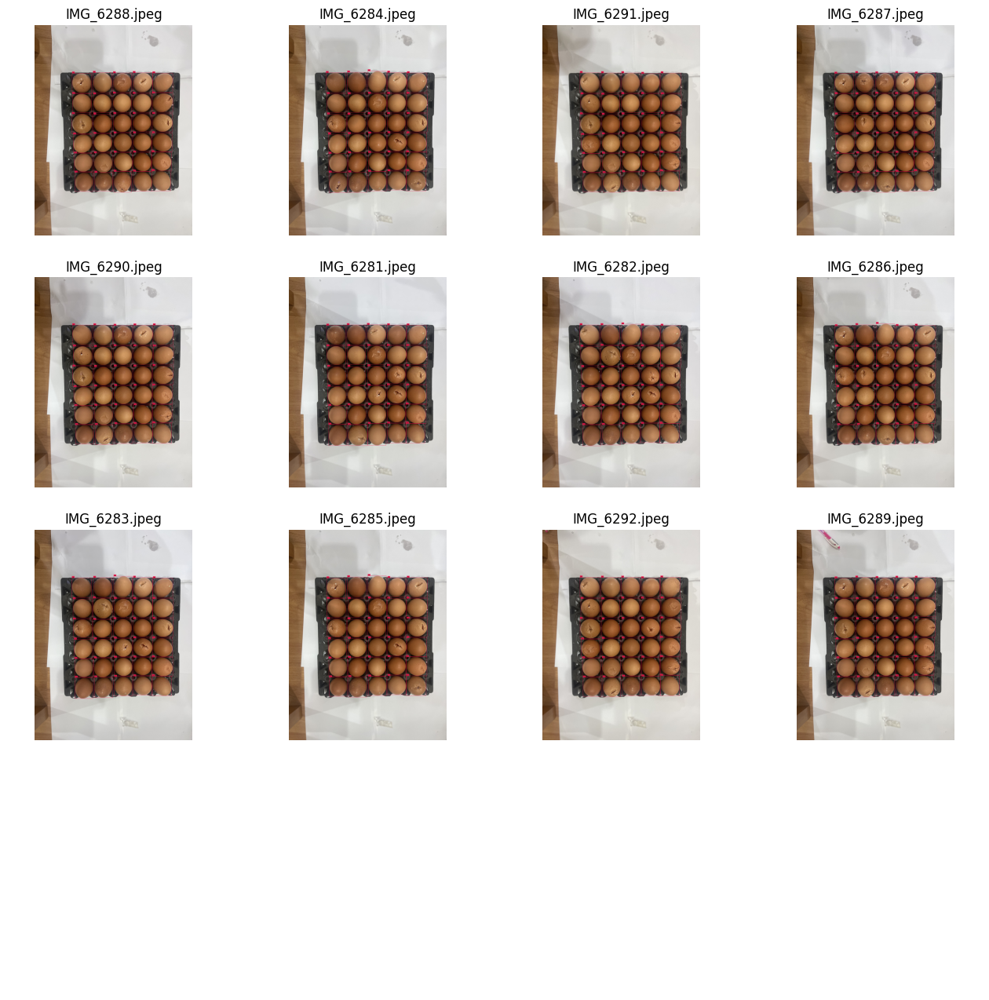

In [ ]:
import supervision as sv

image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

mask_annotator = sv.MaskAnnotator()
box_annotator = sv.BoxAnnotator()

images = []
for image_name in image_names:
    image = dataset.images[image_name]
    annotations = dataset.annotations[image_name]
    labels = [
        dataset.classes[class_id]
        for class_id
        in annotations.class_id]
    annotates_image = mask_annotator.annotate(
        scene=image.copy(),
        detections=annotations)
    annotates_image = box_annotator.annotate(
        scene=annotates_image,
        detections=annotations,
        labels=labels)

    images.append(annotates_image)

sv.plot_images_grid(
    images=images,
    titles=image_names,
    grid_size=SAMPLE_GRID_SIZE,
    size=SAMPLE_PLOT_SIZE)

# Visualizing the Labelled Dataset : Masking

✅ Mask found for IMG_6288.jpeg
✅ Mask found for IMG_6284.jpeg
✅ Mask found for IMG_6291.jpeg
✅ Mask found for IMG_6287.jpeg
✅ Mask found for IMG_6290.jpeg
✅ Mask found for IMG_6281.jpeg
✅ Mask found for IMG_6282.jpeg
✅ Mask found for IMG_6286.jpeg
✅ Mask found for IMG_6283.jpeg


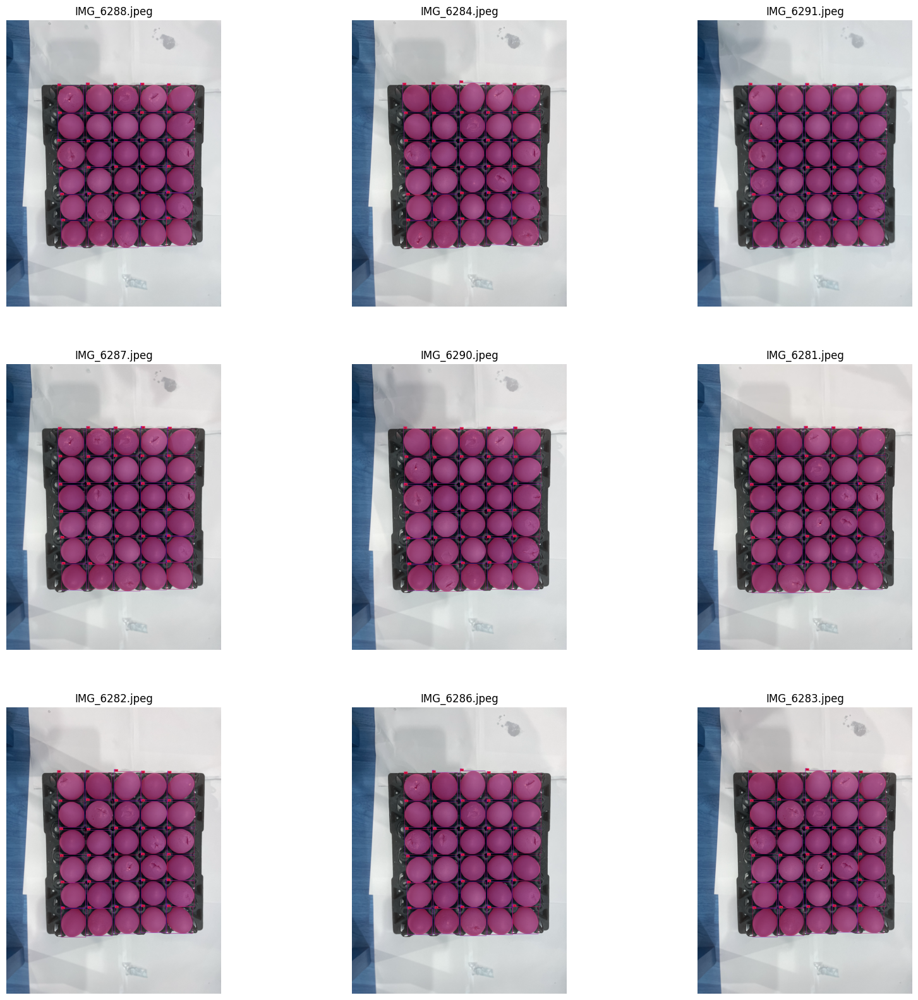

In [ ]:
import os
import matplotlib.pyplot as plt
import supervision as sv

# ✅ Define parameters for visualization
SAMPLE_SIZE = 9
SAMPLE_GRID_SIZE = (3, 3)
SAMPLE_PLOT_SIZE = (20, 20)

# ✅ Get all image names
image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

# ✅ Create annotators
mask_annotator = sv.MaskAnnotator()
box_annotator = sv.BoxAnnotator()

images = []
for image_name in image_names:
    # ✅ Construct full image path
    image_path = os.path.join("/content/dataset5/train/images", image_name)
    image = plt.imread(image_path)

    # ✅ Get results directly from Grounded SAM, using the full path
    results = base_model.predict(image_path)

    # ✅ Ensure masks exist
    if hasattr(results, "mask") and results.mask is not None:
        print(f"✅ Mask found for {image_name}")
    else:
        print(f"❌ No mask found for {image_name}, skipping...")
        continue  # Skip images without masks

    # ✅ Get class labels
    labels = [
        dataset.classes[class_id] if dataset.classes else "Object"
        for class_id in results.class_id
    ]

    # ✅ Apply mask & bounding box annotations
    annotated_image = mask_annotator.annotate(scene=image.copy(), detections=results)
    annotated_image = box_annotator.annotate(scene=annotated_image, detections=results, labels=labels)

    images.append(annotated_image)

# ✅ Display images in a grid
sv.plot_images_grid(images=images, titles=image_names, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)


# Mask, Crop and Save

✅ Saved: /content/no_background_mask/maskegg_0_0.jpg
✅ Saved: /content/no_background_mask/maskegg_0_1.jpg
✅ Saved: /content/no_background_mask/maskegg_0_2.jpg
✅ Saved: /content/no_background_mask/maskegg_0_3.jpg
✅ Saved: /content/no_background_mask/maskegg_0_4.jpg
✅ Saved: /content/no_background_mask/maskegg_0_5.jpg
✅ Saved: /content/no_background_mask/maskegg_0_6.jpg
✅ Saved: /content/no_background_mask/maskegg_0_7.jpg
✅ Saved: /content/no_background_mask/maskegg_0_8.jpg
✅ Saved: /content/no_background_mask/maskegg_0_9.jpg
✅ Saved: /content/no_background_mask/maskegg_0_10.jpg
✅ Saved: /content/no_background_mask/maskegg_0_11.jpg
✅ Saved: /content/no_background_mask/maskegg_0_12.jpg
✅ Saved: /content/no_background_mask/maskegg_0_13.jpg
✅ Saved: /content/no_background_mask/maskegg_0_14.jpg
✅ Saved: /content/no_background_mask/maskegg_0_15.jpg
✅ Saved: /content/no_background_mask/maskegg_0_16.jpg
✅ Saved: /content/no_background_mask/maskegg_0_17.jpg
✅ Saved: /content/no_background_mask/m

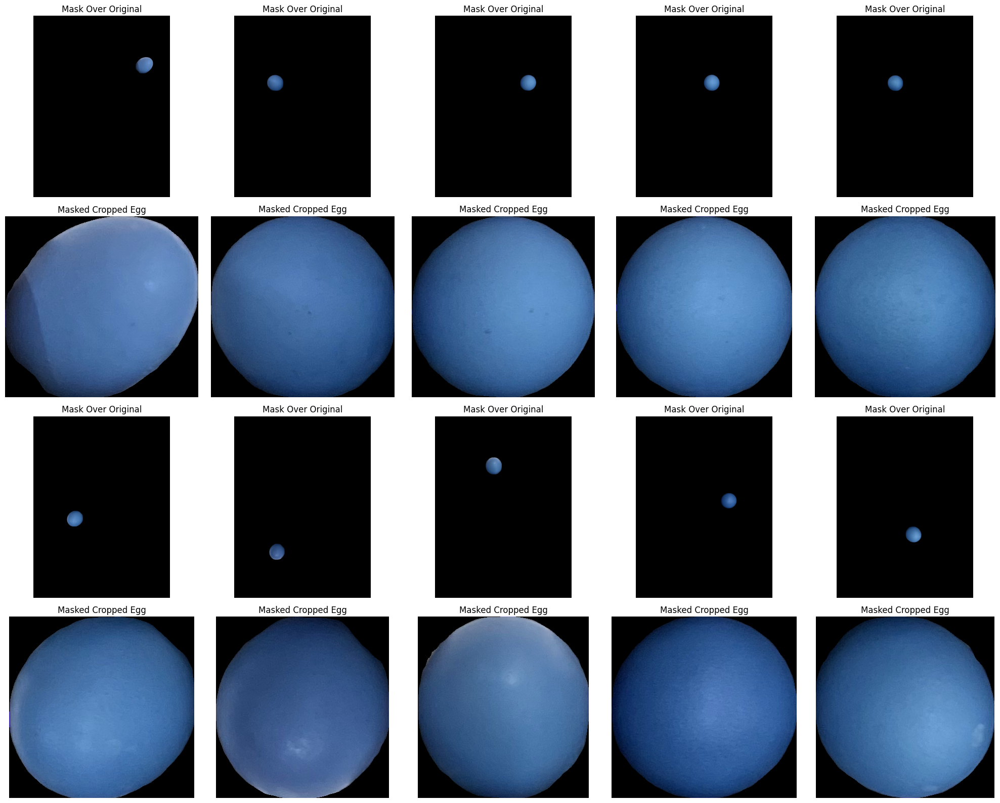

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# ✅ Define parameters
SAMPLE_SIZE = 1  # Number of images to process
IMAGE_DIR = "/content/dataset5/train/images"  # Path to dataset images
OUTPUT_DIR = "/content/no_background_mask/"  # Output directory for cropped images
os.makedirs(OUTPUT_DIR, exist_ok=True)  # Ensure output directory exists

# ✅ Get the first image name
image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

# ✅ Store processed images
mask_over_original = []
mask_over_cropped = []

for i, image_name in enumerate(image_names):
    # ✅ Construct full image path
    image_path = os.path.join(IMAGE_DIR, image_name)
    image = plt.imread(image_path)  # Load image

    # ✅ Get fresh results from Grounded SAM (ensures masks are available)
    results = base_model.predict(image_path)

    # ✅ Ensure detections exist
    if len(results) == 0:
        print(f"⚠️ No detections found for {image_name}, skipping...")
        continue

    # ✅ Ensure masks exist
    if not hasattr(results, "mask") or results.mask is None:
        print(f"❌ No mask found for {image_name}, skipping...")
        continue

    # ✅ Convert image to RGB format
    imageRGB = image[..., ::-1]

    # ✅ Process each mask (limit to 20 for visualization)
    for j, mask in enumerate(results.mask):
        mask = np.squeeze(mask)  # Remove any extra dimensions
        mask = np.stack([mask] * 3, axis=-1)  # Convert grayscale to 3-channel mask

        # ✅ Apply the mask to original image (black background where mask is 0)
        masked_original = np.where(mask, imageRGB, 0)

        # ✅ Find the bounding box of the mask
        rows = np.any(mask, axis=1)
        cols = np.any(mask, axis=0)

        # ✅ Ensure the mask is not empty before cropping
        if not np.any(rows) or not np.any(cols):
            print(f"⚠️ Empty mask detected for {image_name}, skipping cropping...")
            continue

        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]

        # ✅ Crop the image to the masked region
        cropped_image = imageRGB[rmin:rmax, cmin:cmax]
        cropped_mask = mask[rmin:rmax, cmin:cmax]

        # ✅ Apply the mask to cropped egg (background removed)
        masked_cropped = np.where(cropped_mask, cropped_image, 0)

        # ✅ Convert NumPy array to PIL Image and save
        cropped_image_pil = Image.fromarray(masked_cropped.astype(np.uint8))
        save_path = os.path.join(OUTPUT_DIR, f"maskegg_{i}_{j}.jpg")
        cropped_image_pil.save(save_path)
        print(f"✅ Saved: {save_path}")

        # ✅ Store images for visualization
        mask_over_original.append(masked_original)
        mask_over_cropped.append(masked_cropped)

        # ✅ Stop after collecting 20 images
        if len(mask_over_original) >= 30 and len(mask_over_cropped) >= 30:
            break

# ✅ Display 20 cropped images with their corresponding masks in a 4-row, 10-column grid
fig, axes = plt.subplots(4, 5, figsize=(20,16))

# ✅ Row 1: First 10 masked over original images
for ax, img in zip(axes[0], mask_over_original[:5]):
    ax.imshow(img)
    ax.set_title("Mask Over Original")
    ax.axis("off")

# ✅ Row 2: First 10 cropped eggs without background
for ax, img in zip(axes[1], mask_over_cropped[:5]):
    ax.imshow(img)
    ax.set_title("Masked Cropped Egg")
    ax.axis("off")

# ✅ Row 3: Next 10 masked over original images
for ax, img in zip(axes[2], mask_over_original[5:]):
    ax.imshow(img)
    ax.set_title("Mask Over Original")
    ax.axis("off")

# ✅ Row 4: Next 10 cropped eggs without background
for ax, img in zip(axes[3], mask_over_cropped[5:]):
    ax.imshow(img)
    ax.set_title("Masked Cropped Egg")
    ax.axis("off")



plt.tight_layout()
plt.show()


✅ Saved: /content/no_background_eggshell/egg_0_0.jpg
✅ Saved: /content/no_background_eggshell/egg_0_1.jpg
✅ Saved: /content/no_background_eggshell/egg_0_2.jpg
✅ Saved: /content/no_background_eggshell/egg_0_3.jpg
✅ Saved: /content/no_background_eggshell/egg_0_4.jpg
✅ Saved: /content/no_background_eggshell/egg_0_5.jpg
✅ Saved: /content/no_background_eggshell/egg_0_6.jpg
✅ Saved: /content/no_background_eggshell/egg_0_7.jpg
✅ Saved: /content/no_background_eggshell/egg_0_8.jpg
✅ Saved: /content/no_background_eggshell/egg_0_9.jpg
✅ Saved: /content/no_background_eggshell/egg_0_10.jpg
✅ Saved: /content/no_background_eggshell/egg_0_11.jpg
✅ Saved: /content/no_background_eggshell/egg_0_12.jpg
✅ Saved: /content/no_background_eggshell/egg_0_13.jpg
✅ Saved: /content/no_background_eggshell/egg_0_14.jpg
✅ Saved: /content/no_background_eggshell/egg_0_15.jpg
✅ Saved: /content/no_background_eggshell/egg_0_16.jpg
✅ Saved: /content/no_background_eggshell/egg_0_17.jpg
✅ Saved: /content/no_background_eggshe

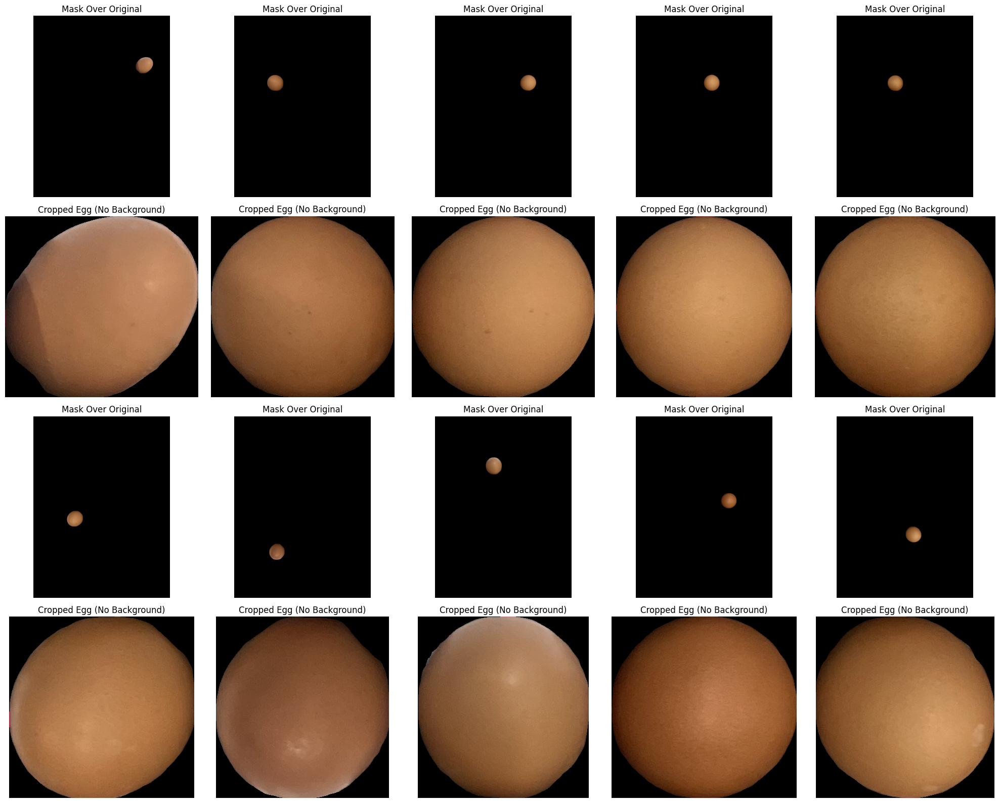

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# ✅ Define parameters
SAMPLE_SIZE = 1  # Number of images to process
IMAGE_DIR = "/content/dataset5/train/images"  # Path to dataset images
OUTPUT_DIR = "/content/no_background_eggshell/"  # Output directory for cropped images
os.makedirs(OUTPUT_DIR, exist_ok=True)  # Ensure output directory exists

# ✅ Get the first image name
image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

# ✅ Store processed images
mask_over_original = []
mask_over_cropped = []

for i, image_name in enumerate(image_names):
    # ✅ Construct full image path
    image_path = os.path.join(IMAGE_DIR, image_name)
    image = Image.open(image_path).convert("RGB")  # Ensure RGB format

    # ✅ Get fresh results from Grounded SAM (ensures masks are available)
    results = base_model.predict(image_path)

    # ✅ Ensure detections exist
    if not results or not hasattr(results, "mask"):
        print(f"⚠️ No detections or masks found for {image_name}, skipping...")
        continue

    # ✅ Process each mask (limit to 20 for visualization)
    for j, mask in enumerate(results.mask):
        mask = np.squeeze(mask)  # Remove any extra dimensions
        if mask.ndim != 2:
            print(f"⚠️ Mask dimension issue for {image_name}, skipping...")
            continue

        # ✅ Convert grayscale mask to 3-channel
        mask = np.stack([mask] * 3, axis=-1)

        # ✅ Convert image to NumPy array
        image_np = np.array(image)

        # ✅ Apply the mask to original image (black background where mask is 0)
        masked_original = np.where(mask, image_np, 0)

        # ✅ Find the bounding box of the mask
        rows = np.any(mask, axis=1)
        cols = np.any(mask, axis=0)

        if not np.any(rows) or not np.any(cols):
            print(f"⚠️ Empty mask detected for {image_name}, skipping cropping...")
            continue

        rmin, rmax = np.where(rows)[0][[0, -1]]
        cmin, cmax = np.where(cols)[0][[0, -1]]

        # ✅ Crop the image to the masked region
        cropped_image = image_np[rmin:rmax, cmin:cmax]
        cropped_mask = mask[rmin:rmax, cmin:cmax]

        # ✅ Apply the mask to cropped egg (background removed)
        masked_cropped = np.where(cropped_mask, cropped_image, 0)

        # ✅ Convert NumPy array to PIL Image and save
        cropped_image_pil = Image.fromarray(masked_cropped.astype(np.uint8))
        save_path = os.path.join(OUTPUT_DIR, f"egg_{i}_{j}.jpg")
        cropped_image_pil.save(save_path)
        print(f"✅ Saved: {save_path}")

        # ✅ Store images for visualization
        mask_over_original.append(masked_original)
        mask_over_cropped.append(masked_cropped)

        # ✅ Stop after collecting 30 images
        if len(mask_over_original) >= 30 and len(mask_over_cropped) >= 30:
            break

# ✅ Display cropped images without masks in a 4-row, 5-column grid
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

# ✅ Row 1: First 5 masked over original images
for ax, img in zip(axes[0], mask_over_original[:5]):
    ax.imshow(img)
    ax.set_title("Mask Over Original")
    ax.axis("off")

# ✅ Row 2: First 5 cropped eggs without background
for ax, img in zip(axes[1], mask_over_cropped[:5]):
    ax.imshow(img)
    ax.set_title("Cropped Egg (No Background)")
    ax.axis("off")

# ✅ Row 3: Next 5 masked over original images
for ax, img in zip(axes[2], mask_over_original[5:10]):
    ax.imshow(img)
    ax.set_title("Mask Over Original")
    ax.axis("off")

# ✅ Row 4: Next 5 cropped eggs without background
for ax, img in zip(axes[3], mask_over_cropped[5:10]):
    ax.imshow(img)
    ax.set_title("Cropped Egg (No Background)")
    ax.axis("off")

plt.tight_layout()
plt.show()


# Performance Profiling of Mask Cropping and Saving

# Resizing image to near 384

🔥 Using device: cpu
⚠️ Model does not accept device parameter, running on default settings.
✅ Saved: /content/no_background_eggshell/eggshell_0_0.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_1.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_2.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_3.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_4.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_5.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_6.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_7.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_8.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_9.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_10.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_11.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_12.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_13.jpg
✅ Saved: /content/no_background_eggshell/eggshell_0_14.jpg
✅ Saved: /content/no_background_e

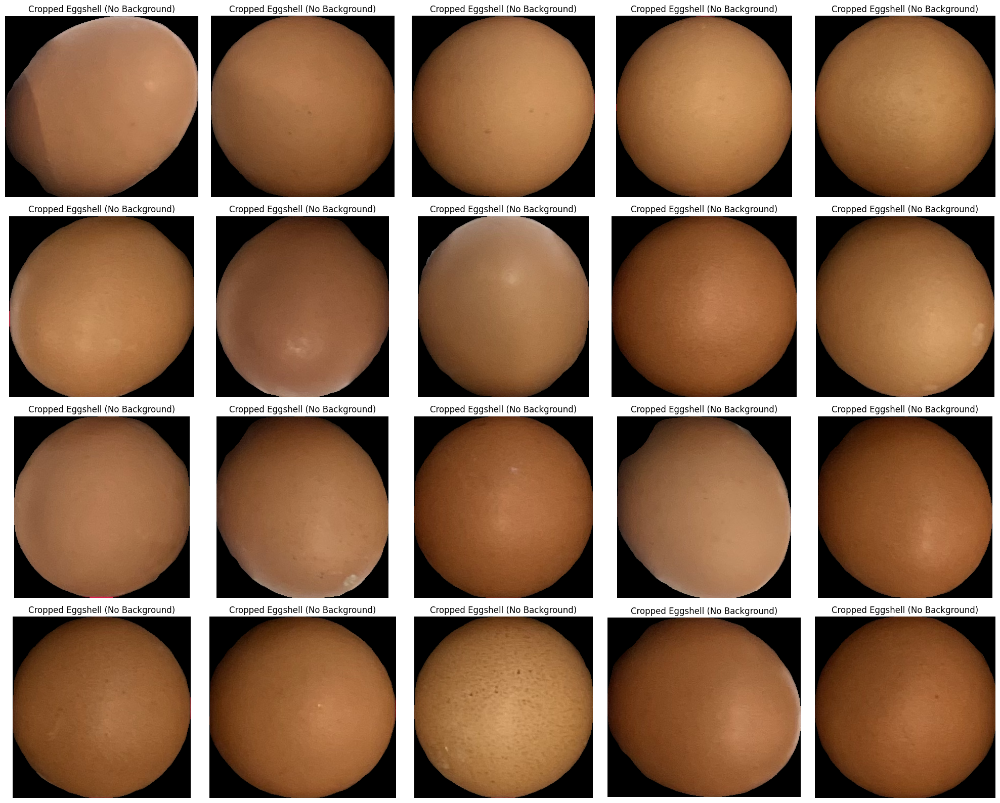

In [ ]:
import os
import numpy as np
import torch
import torch.nn.functional as F
import time
import psutil
import matplotlib.pyplot as plt
from PIL import Image

# ✅ Ensure GPU is used if available
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🔥 Using device: {DEVICE}")

# ✅ Define parameters
SAMPLE_SIZE = 1  # Number of images to process
IMAGE_DIR = "/content/dataset5/train/images"  # Path to dataset images
OUTPUT_DIR = "/content/no_background_eggshell/"  # Output directory for cropped images
os.makedirs(OUTPUT_DIR, exist_ok=True)  # Ensure output directory exists

# ✅ Measure CPU and memory usage before execution
cpu_usage_before = psutil.cpu_percent(interval=1)
memory_usage_before = psutil.virtual_memory().used / (1024 ** 2)  # Convert to MB

# ✅ Start execution time measurement
start_time = time.time()

# ✅ Get the first image name
image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

# ✅ Store processed images
processed_images = []

def resize_image(image, scale=0.5):
    """Resize the image to a given scale (default 10%)"""
    width, height = image.size
    new_size = (int(width * scale), int(height * scale))
    return image.resize(new_size, Image.LANCZOS)  # ✅ Fix for ANTIALIAS issue

for i, image_name in enumerate(image_names):
    # ✅ Construct full image path
    image_path = os.path.join(IMAGE_DIR, image_name)
    image = Image.open(image_path).convert("RGB")  # Ensure RGB format

    # ✅ Resize image to 10% before processing    *****************************************************
    resized_image = resize_image(image, scale=1.0)

    # ✅ Move image to GPU if possible
    resized_image_np = np.array(resized_image)
    resized_image_tensor = torch.tensor(resized_image_np, device=DEVICE).float() / 255.0  # Normalize

    # ✅ Run model inference with forced GPU usage if supported
    try:
        results = base_model.predict(image_path, device=DEVICE)  # Use GPU if model allows
    except TypeError:
        print("⚠️ Model does not accept device parameter, running on default settings.")
        results = base_model.predict(image_path)  # Fallback to default settings

    # ✅ Ensure detections exist
    if not results or not hasattr(results, "mask") or results.mask is None:
        print(f"⚠️ No detections or masks found for {image_name}, skipping...")
        continue

    # ✅ Process each mask
    for j, mask in enumerate(results.mask):
        mask = np.squeeze(mask)  # Convert to NumPy
        mask_tensor = torch.tensor(mask, device=DEVICE)  # Move mask to GPU

        import torch.nn.functional as F

        # ✅ Resize the mask before applying it
        mask_tensor_resized = F.interpolate(
        mask_tensor.unsqueeze(0).unsqueeze(0).float(),  # Add batch & channel dimensions
        size=(resized_image_tensor.shape[0], resized_image_tensor.shape[1]),  # Match resized image dimensions
        mode='nearest'  # Use nearest-neighbor to maintain mask integrity
        ).squeeze(0).squeeze(0)  # Remove extra dimensions

        # ✅ Expand the mask to have 3 channels to match RGB image
        mask_tensor_resized = mask_tensor_resized.unsqueeze(2).expand(-1, -1, 3)

      # ✅ Now apply the resized mask without error
        masked_egg = torch.where(mask_tensor_resized > 0, resized_image_tensor, torch.tensor(0.0, device=DEVICE))



        # ✅ Find the bounding box of the mask (GPU)
        rows = torch.any(mask_tensor_resized, dim=1)
        cols = torch.any(mask_tensor_resized, dim=0)

        if not torch.any(rows) or not torch.any(cols):
            print(f"⚠️ Empty mask detected for {image_name}, skipping cropping...")
            continue

        rmin, rmax = torch.where(rows)[0][[0, -1]]
        cmin, cmax = torch.where(cols)[0][[0, -1]]

        # ✅ Crop the image to the masked region (eggshell only)
        cropped_image = masked_egg[rmin:rmax, cmin:cmax]

        # ✅ Convert to CPU for saving
        cropped_image_np = (cropped_image.cpu().numpy() * 255).astype(np.uint8)
        cropped_image_pil = Image.fromarray(cropped_image_np)

        # ✅ Save cropped image
        save_path = os.path.join(OUTPUT_DIR, f"eggshell_{i}_{j}.jpg")
        cropped_image_pil.save(save_path)
        print(f"✅ Saved: {save_path}")

        # ✅ Store for visualization
        processed_images.append(cropped_image_np)

        # ✅ Stop after processing 90 images
        if len(processed_images) >= 90:
            break

# ✅ End execution time measurement
end_time = time.time()

# ✅ Measure CPU and memory usage after execution
cpu_usage_after = psutil.cpu_percent(interval=1)
memory_usage_after = psutil.virtual_memory().used / (1024 ** 2)  # Convert to MB
gpu_memory_usage = torch.cuda.memory_allocated() / (1024**2) if torch.cuda.is_available() else "N/A"

# ✅ Compute performance metrics
total_time = end_time - start_time
average_latency = total_time / SAMPLE_SIZE if SAMPLE_SIZE else None
fps = SAMPLE_SIZE / total_time if total_time > 0 else None
average_cpu_usage = (cpu_usage_before + cpu_usage_after) / 2
average_memory_usage = memory_usage_after - memory_usage_before

# ✅ Display performance results
performance_results = {
    "Device Used": DEVICE,
    "Average Latency (seconds)": round(average_latency, 4) if average_latency else "N/A",
    "Average FPS": round(fps, 2) if fps else "N/A",
    "Average CPU Usage (%)": round(average_cpu_usage, 2),
    "Average Memory Usage (MB)": round(average_memory_usage, 2),
    "GPU Memory Usage (MB)": gpu_memory_usage,
}

print(performance_results)

# ✅ Display cropped eggshell images (4-row, 5-column grid)
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for ax, img in zip(axes.flatten(), processed_images[:20]):
    ax.imshow(img)
    ax.set_title("Cropped Eggshell (No Background)")
    ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# ✅ Assume each original image contains 30 eggs
EGGS_PER_IMAGE = 30

# ✅ Compute performance per egg
average_latency_per_egg = average_latency / EGGS_PER_IMAGE if average_latency else "N/A"
fps_per_egg = fps * EGGS_PER_IMAGE if fps else "N/A"

# ✅ Display performance results (per egg image)
performance_results_per_egg = {
    "Device Used": DEVICE,
    "Average Latency per Image (seconds)": round(average_latency, 4) if average_latency else "N/A",
    "Average FPS per Image": round(fps, 2) if fps else "N/A",
    "Average Latency per Egg (seconds)": round(average_latency_per_egg, 4) if isinstance(average_latency_per_egg, float) else "N/A",
    "Estimated FPS per Egg": round(fps_per_egg, 2) if isinstance(fps_per_egg, float) else "N/A",
    "Average CPU Usage (%)": round(average_cpu_usage, 2),
    "Average Memory Usage (MB)": round(average_memory_usage, 2),
    "GPU Memory Usage (MB)": gpu_memory_usage,
}

# ✅ Print performance results per egg
print("\n🔥 Estimated Performance Per Egg Image:")
for key, value in performance_results_per_egg.items():
    print(f"{key}: {value}")



🔥 Estimated Performance Per Egg Image:
Device Used: cpu
Average Latency per Image (seconds): 57.5273
Average FPS per Image: 0.02
Average Latency per Egg (seconds): 1.9176
Estimated FPS per Egg: 0.52
Average CPU Usage (%): 11.8
Average Memory Usage (MB): -24291.43
GPU Memory Usage (MB): N/A


In [ ]:
# ✅ Assume each original image contains 30 eggs
EGGS_PER_IMAGE = 30

# ✅ Example values (Replace these with actual computed values)
average_latency = 3.7371   # Example: Average inference latency per image (seconds)
average_total_processing_time = 4.1216  # Example: Average total processing time per image (seconds)
average_cpu_usage = 15.79  # Example: Average CPU usage (%)
average_memory_usage = 4595.75  # Example: Average RAM usage (MB)
gpu_memory_usage = 3176.61  # Example: GPU memory usage (MB)

# ✅ Compute total latency per image (Inference Latency + Processing Time)
combined_latency_per_image = average_latency + average_total_processing_time

# ✅ Compute FPS per image using 1 / Combined Latency
average_fps_per_image = 1 / combined_latency_per_image if combined_latency_per_image > 0 else "N/A"

# ✅ Compute performance per egg
average_latency_per_egg = combined_latency_per_image / EGGS_PER_IMAGE if combined_latency_per_image else "N/A"
fps_per_egg = average_fps_per_image * EGGS_PER_IMAGE if isinstance(average_fps_per_image, float) else "N/A"

# ✅ Display performance results (per egg image)
performance_results_per_egg = {
    "Device Used": "cuda",
    "Average Latency per Image (seconds)": round(average_latency, 4),
    "Average Total Processing Time per Image (seconds)": round(average_total_processing_time, 4),
    "Combined Latency per Image (seconds)": round(combined_latency_per_image, 4),  # Updated latency
    "Average FPS per Image": round(average_fps_per_image, 2) if isinstance(average_fps_per_image, float) else "N/A",
    "Average Latency per Egg (seconds)": round(average_latency_per_egg, 4) if isinstance(average_latency_per_egg, float) else "N/A",
    "Estimated FPS per Egg": round(fps_per_egg, 2) if isinstance(fps_per_egg, float) else "N/A",
    "Average CPU Usage (%)": round(average_cpu_usage, 2),
    "Average Memory Usage (MB)": round(average_memory_usage, 2),
    "GPU Memory Usage (MB)": gpu_memory_usage,
}

# ✅ Print performance results per egg
print("\n🔥 Estimated Performance Per Egg Image:")
for key, value in performance_results_per_egg.items():
    print(f"{key}: {value}")



🔥 Estimated Performance Per Egg Image:
Device Used: cuda
Average Latency per Image (seconds): 3.7371
Average Total Processing Time per Image (seconds): 4.1216
Combined Latency per Image (seconds): 7.8587
Average FPS per Image: 0.13
Average Latency per Egg (seconds): 0.262
Estimated FPS per Egg: 3.82
Average CPU Usage (%): 15.79
Average Memory Usage (MB): 4595.75
GPU Memory Usage (MB): 3176.61


Glyph 128196 (\N{PAGE FACING UP}) missing from font(s) DejaVu Sans.
Glyph 128207 (\N{STRAIGHT RULER}) missing from font(s) DejaVu Sans.
Glyph 128194 (\N{OPEN FILE FOLDER}) missing from font(s) DejaVu Sans.


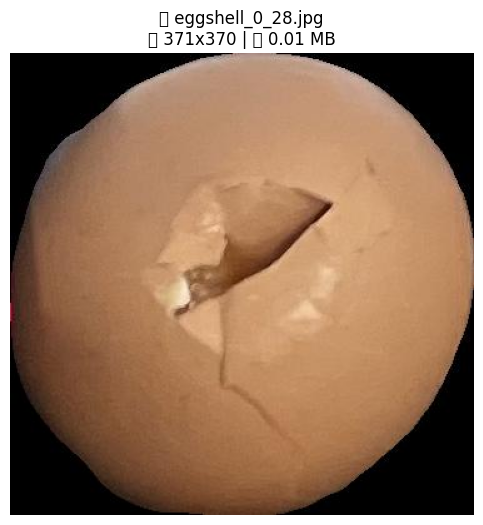


✅ Image Details:
📄 File Name: eggshell_0_28.jpg
📏 Resolution: 371 x 370 pixels
📂 File Size: 0.01 MB


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# ✅ Define the saved image path
SAVED_IMAGE_PATH = "/content/no_background_eggshell/eggshell_0_28.jpg"

# ✅ Check if the file exists before proceeding
if os.path.exists(SAVED_IMAGE_PATH):
    # ✅ Load the image
    image = cv2.imread(SAVED_IMAGE_PATH)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for proper display

    # ✅ Get image dimensions (width × height)
    image_height, image_width = image.shape[:2]

    # ✅ Get file size in MB
    image_size_mb = os.path.getsize(SAVED_IMAGE_PATH) / (1024 * 1024)

    # ✅ Extract file name from path
    image_filename = os.path.basename(SAVED_IMAGE_PATH)

    # ✅ Display image with title
    plt.figure(figsize=(6, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"📄 {image_filename}\n📏 {image_width}x{image_height} | 📂 {image_size_mb:.2f} MB")
    plt.show()

    # ✅ Print details in console
    print(f"\n✅ Image Details:")
    print(f"📄 File Name: {image_filename}")
    print(f"📏 Resolution: {image_width} x {image_height} pixels")
    print(f"📂 File Size: {image_size_mb:.2f} MB")
else:
    print(f"⚠️ Error: Image file '{SAVED_IMAGE_PATH}' not found!")
